#Trabajo Final Edgar José Correa Diazgranados

### 0. librerías

In [ ]:
from datetime import datetime
import matplotlib.pyplot as plt

import tensorflow as tf
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sb #sns -pendiente por si falla algo

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

## librerias a usar para los metodos

import sklearn as sk
from sklearn import model_selection
from sklearn import neural_network
from sklearn import metrics

from sklearn.neural_network import MLPRegressor
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn import set_config
import multiprocessing


from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from matplotlib import pyplot as plt

from sklearn.model_selection import GridSearchCV

from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression



from sklearn import linear_model
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline


from sklearn.model_selection import KFold

import statsmodels.api as sm


import matplotlib.pyplot as plt


from sklearn.datasets import load_boston
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance
import multiprocessing
import math

## Import the keras API
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import InputLayer, Input
from tensorflow.python.keras.layers import Reshape, MaxPooling2D
from tensorflow.python.keras.layers import Conv2D, Dense, Flatten


from sklearn.model_selection import train_test_split
from keras.layers import Input
from keras.layers import Dense
from keras.models import Model
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix


#autenticación de credenciales google
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

#mi archivo en drive
fileDownloaded = drive.CreateFile({'id':'1C6h8IUWLJZNOuPCx5YlZMtzz7nXXZBbQ'})

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 1.Entendiendo el problema

Una de las actividades más importantes para los bancos, es la formulación y
parametrización de campañas. Estas permiten mejorar las experiencias de los clientes en
términos de servicio ya que suelen ser enviadas a los clientes más propensos a adquirir el
producto sujeto de la campaña.

Supongamos que los depósitos a plazo (CDT’s) se han visto afectados debido al
comportamiento de diferentes variables macroeconómicas y no se está cumpliendo con
las metas fijadas en cuanto a número de clientes que abrieron un CDT el último trimestre.

Ante dicha situación, las áreas analíticas y de negocio buscan desarrollar una campaña
para promover la apertura de CDT’s. Para estar en línea con la estrategia analítica de la
organización, el objetivo es que dicha campaña está basada en un modelo de clasificación,
en otras palabras, el área de negocio desea tener una herramienta (modelo) que permita
clasificar a partir de diversas variables financieras y socio-demográficas que clientes van a
aceptar una oferta de CDT cuando sean contactados.

Dado que se busca aplicar el modelo, es necesario que este modelo sea lo más transparente,documentado e interpretable posible, por ello se debe
documentar todas las etapas de desarrollo.





##2. Base de datos

### 2.1. Descarga

In [ ]:
from zipfile import ZipFile
fileDownloaded.GetContentFile('REDES.zip')
! unzip /content/REDES.zip -d /content/REDES

Archive:  /content/REDES.zip
replace /content/REDES/REDES/test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
train = pd.read_csv('/content/REDES/REDES/train.csv')
test = pd.read_csv('/content/REDES/REDES/test.csv')


### 2.2. Descripción

####2.2.1. Explicación

In [ ]:
train.columns

Index(['ID', 'Edad', 'Tipo_Trabajo', 'Estado_Civil', 'Educacion',
       'Incumplimiento', 'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias',
       'Campana', 'Dias_Ultima_Camp', 'No_Contactos', 'Resultado_Anterior',
       'emp_var_rate', 'cons_price_idx', 'cons_conf_idx', 'euribor3m',
       'nr_employed', 'y'],
      dtype='object')

La base de datos a analizar tiene 20 variables explicativas y 1 variable respuesta.

Las variables explicativas estan divididas en 3 grupos:

**Financieras y demográficas:**

1.   Edad (numerica)
2.   Tipo_Trabajo(categórica):

*   'admin'- administrativo
*   'blue-collar'-es un término que se utiliza, particularmente en países de habla inglesa, para designar a los individuos que forman la parte más baja de la jerarquía de las empresas
* 'entrepreneur'-emprendedor
* 'housemaid'- criado o criada
* 'management'
* 'retired'
* 'self-employed'
*'services'
* 'student'
* 'technician'
* 'unemployed'
* 'unknown'

3. Estado_Civil : marital status (categorica):

* 'divorced'- divorciado, también puede ser viudo
* 'married'
* 'single'
* 'unknown'

4. Educacion (categorica):

* 'basic.4y'
* 'basic.6y'
* 'basic.9y'
* 'high.school'
* 'illiterate'-analfabeta
* 'professional.course'
* 'university.degree'
* 'unknown'

5. Incumplimiento: ¿Tiene algun credito en  default? (categorica):

* 'no'
* 'yes'
* 'unknown'

6. Vivienda: has housing loan? (categorica):

* 'no'
* 'yes'
* 'unknown'
7. Consumo: has personal loan? (categorica):

* 'no'
* 'yes'
* 'unknown'


**Relacionado con el último contacto de la campaña actual:**
8. Contacto(categórica): contacto tipo de comunicación
* 'cellular'
* 'telephone'

9. Mes(categórica): último contacto mes del año
*  'jan', 'feb', 'mar', ..., 'nov', 'dec')
10. Dia(categórica): último dia de contacto de la semana
* 'mon','tue','wed','thu','fri'
11. Campana(númerica): número de contactos realizados durante esta campaña y para este cliente (incluye último contacto)
12. Dias_Ultima_Cam(númerica):número de días que pasaron desde la última vez que se contactó al cliente de una campaña anterior (999 significa que no se contactó al cliente anteriormente)
13. No_Contactos(númerica):número de contactos realizados antes de esta campaña y para este cliente
14. Resultado_Anterior(Categórica):
resultado de la campaña de marketing anterior
*  'failure'- fracaso
* 'nonexistent'-no existe
* 'success'-exitosa



**Atributos del contexto social y económico:**

15.emp_var_rate(númerica): tasa de variación del empleo - indicador trimestral

16.cons_price_idx(númerica): índice de precios al consumidor - indicador mensual
17.cons_conf_idx(númerico): índice de confianza del consumidor - indicador mensual
18.euribor3m (númerica): euribor 3 meses tasa - indicador diario. Euribir  es un índice de referencia publicado diariamente que indica el tipo de interés promedio al que un gran número de bancos europeos dicen concederse préstamos a corto plazo entre ellos para prestárselo a terceros -particulares y empresas-
19.nr_employed(númerica):número de empleados - indicador trimestral

**Variable de salida (objetivo deseado):**
21. y(categorica):
¿El cliente ha suscrito un depósito a plazo?
 *'yes = 1'
 *'no = 0'




son 7 variables númericas y 14 categóricas

#### 2.2.2. Vista

In [ ]:
train.head()

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,...,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
0,14110,44,admin.,married,university.degree,no,yes,yes,cellular,jul,...,4,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
1,13250,38,blue-collar,married,high.school,no,yes,no,cellular,jul,...,5,999,0,nonexistent,1.4,93918.0,-42.7,4963.0,5228.1,0
2,13728,52,blue-collar,single,unknown,unknown,no,yes,cellular,jul,...,11,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
3,27503,40,blue-collar,married,basic.9y,no,yes,no,cellular,may,...,1,999,1,failure,-1.8,92893.0,-46.2,1266.0,5099.1,0
4,17265,31,admin.,single,university.degree,no,no,yes,cellular,aug,...,2,999,0,nonexistent,1.4,93444.0,-36.1,4963.0,5228.1,0


In [ ]:
test.head()

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
0,30785,98,retired,married,basic.4y,unknown,yes,no,cellular,oct,fri,2,999,0,nonexistent,-3.4,92431.0,-26.9,0.730,5017.5
1,14243,45,self-employed,divorced,university.degree,no,no,no,cellular,jul,tue,4,999,0,nonexistent,1.4,93918.0,-42.7,4961.000,5228.1
2,20996,41,blue-collar,married,basic.4y,no,yes,no,telephone,nov,thu,3,999,0,nonexistent,-0.1,93.2,-42.0,4076.000,5195.8
3,31958,68,retired,married,basic.4y,no,yes,no,cellular,jun,thu,2,999,1,failure,-1.7,94055.0,-39.8,0.742,4991.6
4,10457,28,services,married,high.school,no,no,yes,cellular,jul,tue,1,999,0,nonexistent,1.4,93918.0,-42.7,4962.000,5228.1


In [ ]:
print(train.shape,test.shape)

(26373, 21) (6594, 20)


## 3. Análisis exploratorio de datos- EDA

### 3.1 Tipos de variables

In [ ]:
train.info() #No hay valores nulo

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26373 entries, 0 to 26372
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  26373 non-null  int64  
 1   Edad                26373 non-null  int64  
 2   Tipo_Trabajo        26373 non-null  object 
 3   Estado_Civil        26373 non-null  object 
 4   Educacion           26373 non-null  object 
 5   Incumplimiento      26373 non-null  object 
 6   Vivienda            26373 non-null  object 
 7   Consumo             26373 non-null  object 
 8   Contacto            26373 non-null  object 
 9   Mes                 26373 non-null  object 
 10  Dias                26373 non-null  object 
 11  Campana             26373 non-null  int64  
 12  Dias_Ultima_Camp    26373 non-null  int64  
 13  No_Contactos        26373 non-null  int64  
 14  Resultado_Anterior  26373 non-null  object 
 15  emp_var_rate        26373 non-null  float64
 16  cons

In [ ]:
train.describe()

,ID,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
count,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000
mean,16423.772040,40.039245,2.587078,962.857051,0.169643,0.096003,85606.636477,-40.504031,3192.809493,5167.531362,0.112919
std,9506.996292,10.413698,2.818767,185.963406,0.491433,1.565612,26179.858733,4.608465,2086.437238,72.052888,0.316499
min,1.000000,17.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000,0.000000
25%,8191.000000,32.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000,0.000000
50%,16383.000000,38.000000,2.000000,999.000000,0.000000,1.100000,93798.000000,-41.800000,4856.000000,5191.000000,0.000000
75%,24632.000000,47.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000,0.000000
max,32967.000000,95.000000,43.000000,999.000000,6.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000,1.000000


In [ ]:
traind=train.drop(['ID','y'],axis=1) # el id se elimina
traindy=train.drop(['ID'],axis=1) # el id se elimina
#traind


#### 3.1.1. Categóricas

## Se indaga sobre las variables categóricas

In [ ]:
categoricas_ = traind.select_dtypes(include=['object']).columns
#train.info() #No hay valores nulo
categoricas_

Index(['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento',
       'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias', 'Resultado_Anterior'],
      dtype='object')

In [ ]:
# descripcion de la variables categoricas
train.select_dtypes(include=['object']).describe()

,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,Dias,Resultado_Anterior
count,26373,26373,26373,26373,26373,26373,26373,26373,26373,26373
unique,12,4,8,3,3,3,2,10,5,3
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent
freq,6657,15957,7623,20896,13921,21727,16659,8833,5484,22845


In [ ]:
import seaborn as sns
sns.pairplot(traind.select_dtypes(include=['object']), diag_kind='kde')

ValueError: ignored

In [ ]:
#cuando se tiene mas de 5 categorias se recomienda hacer Ordinal Encoding si se tienen menos de 5
# se recomienda hacer One-Hot Encoding o dummy(dummy es mejor porque crea menos categorias)
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
ordinal_col1 = ['Tipo_Trabajo'] # variables ordinales
ordinal_col2 = ['Estado_Civil']
X1 = train[ordinal_col1]
X2 = train[ordinal_col2]

# OrdinalEncoder automatico
oe1 = OrdinalEncoder()
dd1=oe1.fit_transform(X1)

oe2 = OrdinalEncoder()
dd2=oe2.fit_transform(X2)
train['Tipo_Trabajo']=dd1
train['Estado_Civil']=dd2

In [ ]:
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
data = pd.DataFrame(train["Incumplimiento"])
#print(data)
encoder = OneHotEncoder(sparse=False)
# transform data
onehot = encoder.fit_transform(data)
onehot #no,unknown, yes
oh=pd.DataFrame(onehot)
oh.rename(columns = {0:'in_no', 1:'in_unk',2:'in_ye'}, inplace = True)
print(oh)

In [ ]:
#X = train[categorical_cols]
# OneHotEncoder creates 60 columns
#ohe = OneHotEncoder()
#ohe.fit_transform(X).shape

In [ ]:
#o podriamos querer convertir a string un campo
#train['SEX']=["F" if i==1 else "M" for i in data1['SEX']]   #esta forma solo sirve para dos categorías de valor

In [ ]:
# encoder manual
train['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":7,"professional.course":6},  inplace = True)
train["Mes"].replace({"mar":3, "apr":4, "may":5,"jun":6,"jul":7,"aug":8,"sep":9,"oct":10,"nov":11,"dec":12},  inplace = True)
train["Dias"].replace({"mon":1, "tue":2, "wed":3,"thu":4,"fri":5},  inplace = True)

In [ ]:
#train['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":6,"professional.course":7},  inplace = True)
#train_dummy = pd.get_dummies(train, prefix=dum_cols, columns=dum_cols, drop_first=True)
dum_cols = ['Incumplimiento','Vivienda','Consumo','Contacto','Resultado_Anterior']#las columnas que se van a transformar con Dummies


In [ ]:
train_dummy = pd.get_dummies(train, prefix=dum_cols, columns=dum_cols, drop_first=True)
train_dummy

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,...,y,Incumplimiento_unknown,Incumplimiento_yes,Vivienda_unknown,Vivienda_yes,Consumo_unknown,Consumo_yes,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
0,14110,44,0.0,1.0,university.degree,jul,mon,4,999,0,...,0,0,0,0,1,0,1,0,1,0
1,13250,38,1.0,1.0,high.school,jul,wed,5,999,0,...,0,0,0,0,1,0,0,0,1,0
2,13728,52,1.0,2.0,unknown,jul,fri,11,999,0,...,0,1,0,0,0,0,1,0,1,0
3,27503,40,1.0,1.0,basic.9y,may,thu,1,999,1,...,0,0,0,0,1,0,0,0,0,0
4,17265,31,0.0,2.0,university.degree,aug,tue,2,999,0,...,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,57,3.0,1.0,basic.4y,nov,fri,1,999,0,...,0,0,0,0,0,0,0,0,1,0
26369,27490,32,1.0,1.0,basic.9y,may,thu,2,999,0,...,0,0,0,0,1,0,0,0,1,0
26370,353,57,9.0,1.0,basic.4y,may,tue,1,999,0,...,0,1,0,0,0,0,1,1,1,0
26371,29033,32,9.0,1.0,professional.course,jun,mon,1,999,0,...,0,0,0,0,1,0,0,0,1,0


##c

In [ ]:
a=test['Mes']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='Mes',y=b.index,orientation='h')
fig.show()

In [ ]:
train["Mes"].replace({"mar":3, "apr":4, "may":5,"jun":6,"jul":7,"aug":8,"sep":9,"oct":10,"nov":11,"dec":12},  inplace = True)

In [ ]:
train["Mes"]

0         7
1         7
2         7
3         5
4         8
         ..
26368    11
26369     5
26370     5
26371     6
26372     5
Name: Mes, Length: 26373, dtype: int64

In [ ]:
a=train['Dias']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='Dias',y=b.index,orientation='h')
fig.show()

In [ ]:
train["Dias"].replace({"mon":1, "tue":2, "wed":3,"thu":4,"fri":5},  inplace = True)


In [ ]:
train["Dias"]

0          1
1        wed
2          5
3          4
4          2
        ... 
26368      5
26369      4
26370      2
26371      1
26372    wed
Name: Dias, Length: 26373, dtype: object

##### 3.1.1.1. Tipo Trabajo

In [ ]:
#Tipo Trabajo
tab=pd.pivot_table(train,index='Tipo_Trabajo',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Tipo_Trabajo',0]]
aa["acepta_CDT"]=0
aa. rename(columns = {0:'Numero_personas'}, inplace = True)
bb=sdf[['Tipo_Trabajo',1]]
bb["acepta_CDT"]=1
bb. rename(columns = {1:'Numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="Numero_personas",y="Tipo_Trabajo",color="acepta_CDT",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo al Tipo de trabajo')
fig.show()


In [ ]:
# tasa de aceptación
tt=tab[1]/(tab[0]+tab[1])
max(tt)
sdf=tt.reset_index()
sdf. rename(columns = {0:'tasa de aceptación'}, inplace = True)
sdf
al=sdf.sort_values(by=["tasa de aceptación"], ascending=False)
al.head(20)

,Tipo_Trabajo,tasa de aceptación
8,student,0.328520
5,retired,0.264253
10,unemployed,0.139881
0,admin.,0.127385
4,management,0.113525
11,unknown,0.112821
9,technician,0.111421
3,housemaid,0.103397
6,self-employed,0.090909
2,entrepreneur,0.089744


Se evidencia previamente que los estudiantes y retirados tienen la tasa mayor de aceptación de CDTs

##### 3.1.1.2. Estado civil

In [ ]:
#estado civil
tab=pd.pivot_table(train,index='Estado_Civil',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Estado_Civil',0]]
aa["Acepta_CDT"]=0
aa. rename(columns = {0:'Numero_personas'}, inplace = True)
bb=sdf[['Estado_Civil',1]]
bb["Acepta_CDT"]=1
bb. rename(columns = {1:'Numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="Numero_personas",y="Estado_Civil",color="Acepta_CDT",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo al estado civil')
fig.show()

In [ ]:
# tasa de aceptación
tt=tab[1]/(tab[0]+tab[1])
max(tt)
sdf=tt.reset_index()
sdf. rename(columns = {0:'tasa de aceptación'}, inplace = True)
sdf
al=sdf.sort_values(by=["tasa de aceptación"], ascending=False)
al.head(10)

,Estado_Civil,tasa de aceptación
3,unknown,0.200000
2,single,0.141465
1,married,0.101648
0,divorced,0.101041


Es notorio que las personas solteras tienen un indice mayor de aceptación

##### 3.1.1.3. Educación

In [ ]:
#Educación
tab=pd.pivot_table(train,index='Educacion',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Educacion',0]]
aa["Acepta_CDT"]=0
aa. rename(columns = {0:'Numero_personas'}, inplace = True)
bb=sdf[['Educacion',1]]
bb["Acepta_CDT"]=1
bb. rename(columns = {1:'Numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="Numero_personas",y="Educacion",color="Acepta_CDT",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo al estado civil')
fig.show()

In [ ]:
train['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":6,"professional.course":7},  inplace = True)

In [ ]:
train['Educacion']

0        6
1        5
2        0
3        4
4        6
        ..
26368    2
26369    4
26370    2
26371    7
26372    3
Name: Educacion, Length: 26373, dtype: int64

In [ ]:
li=train.Educacion
plist = li.values.tolist()
dict(zip(plist,map(lambda x: plist.count(x),plist)))

{'basic.4y': 2728,
 'basic.6y': 1486,
 'basic.9y': 3911,
 'high.school': 6152,
 'illiterate': 11,
 'professional.course': 3349,
 'university.degree': 7623,
 'unknown': 1113}

In [ ]:
# tasa de aceptación
tt=tab[1]/(tab[0]+tab[1])
max(tt)
sdf=tt.reset_index()
sdf. rename(columns = {0:'tasa de aceptación'}, inplace = True)
sdf
al=sdf.sort_values(by=["tasa de aceptación"], ascending=False)
al.head(10)

,Educacion,tasa de aceptación
4,illiterate,0.363636
6,university.degree,0.139446
7,unknown,0.132974
5,professional.course,0.114960
3,high.school,0.109395
0,basic.4y,0.107405
1,basic.6y,0.083445
2,basic.9y,0.073638


A pesar de que los analfabetas tienen la tasa de aceptación más alta es importante aclarar que solo habia 11 personas y de estas 4 aceptaron, es de resaltar la tasa de aceptación de las personas con pregrado universitario

##### 3.1.1.4 Incumplimiento

In [ ]:
#Incumplimiento
tab=pd.pivot_table(train,index='Incumplimiento',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Incumplimiento',0]]
aa["Acepta_CDT"]=0
aa. rename(columns = {0:'Numero_personas'}, inplace = True)
bb=sdf[['Incumplimiento',1]]
bb["Acepta_CDT"]=1
bb. rename(columns = {1:'Numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="Numero_personas",y="Incumplimiento",color="Acepta_CDT",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo al incumplimiento')
fig.show()

In [ ]:
li=train.Incumplimiento
plist = li.values.tolist()
dict(zip(plist,map(lambda x: plist.count(x),plist)))

{'no': 20896, 'unknown': 5475, 'yes': 2}

##### 3.1.1.5 Mes

In [ ]:
#mes
tab=pd.pivot_table(train,index='Mes',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Mes',0]]
aa["Acepta_CDT"]=0
aa. rename(columns = {0:'Numero_personas'}, inplace = True)
bb=sdf[['Mes',1]]
bb["Acepta_CDT"]=1
bb. rename(columns = {1:'Numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="Numero_personas",y="Mes",color="Acepta_CDT",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo al mes')
fig.show()

#### 3.1.2.Númericas

In [ ]:
numericas = traind.dtypes!=object
numericas_ = traind.columns[numericas].tolist()
numericas_

['Edad',
 'Campana',
 'Dias_Ultima_Camp',
 'No_Contactos',
 'emp_var_rate',
 'cons_price_idx',
 'cons_conf_idx',
 'euribor3m',
 'nr_employed']

In [ ]:
#descripcion de las variables cuantitativas
train[numericas_].describe()


,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
count,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000,26373.000000
mean,40.039245,2.587078,962.857051,0.169643,0.096003,85606.636477,-40.504031,3192.809493,5167.531362
std,10.413698,2.818767,185.963406,0.491433,1.565612,26179.858733,4.608465,2086.437238,72.052888
min,17.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000
25%,32.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000
50%,38.000000,2.000000,999.000000,0.000000,1.100000,93798.000000,-41.800000,4856.000000,5191.000000
75%,47.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000
max,95.000000,43.000000,999.000000,6.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000


Se grafica la variable respuesta para entender que porcentaje de las personas aceptan un CDT

In [ ]:
#y
a=train['y']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='y',y=b.index,orientation='h')
fig.show()



In [ ]:
2978/23395

0.12729215644368455

Solo el 12% de las personas acepta el CDT

#### 3.1.2. Grafico conjunto

Con la intensión de ver todas las variables númericas y entender si es necesario recategorizar alguna se grafican todas las variables

In [ ]:
def plot_grid(data, fig_size, grid_size, plot_type, target = ''):

    fig = plt.figure(figsize = fig_size)
    if plot_type == 'histplot':
        for i, column_name in enumerate(data.select_dtypes(exclude = 'object').columns):
            fig.add_subplot(grid_size[0], grid_size[1], i + 1)
            plot = sns.histplot(data[column_name], kde = True, color = 'royalblue', stat = 'count')
    if plot_type == 'boxplot':
        for i, column_name in enumerate(data.select_dtypes(exclude = 'object').columns):
            fig.add_subplot(grid_size[0], grid_size[1], i + 1)
            plot = sns.boxplot(x = data[column_name], color = 'royalblue')
    if plot_type == 'countplot':
        target = data[target]
        for i, column_name in enumerate(data.drop(target.name, axis = 1).columns):
            fig.add_subplot(grid_size[0], grid_size[1], i + 1)
            plot = sns.countplot(x = data[column_name], hue = target, palette = 'Blues_r')
            plot.legend(loc = 'upper right', title = target.name)
    plt.tight_layout()

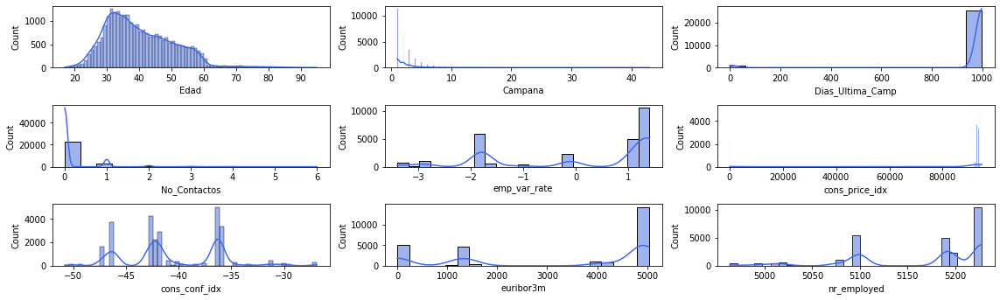

In [ ]:
plot_grid(train.drop(['y','ID'], axis=1),(16, 6), (4,3), 'histplot')

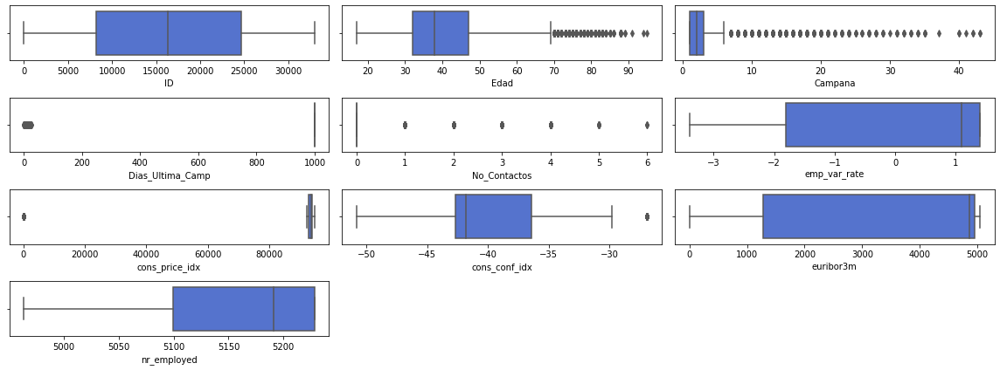

In [ ]:
plot_grid(train.drop('y', axis = 1), (16, 6), (4,3), 'boxplot')

Parece ser que las variables Edad, Campana y Dias_Ultima_Camp deben ser recategorizadas

#### 3.1.2.1.  Edad

In [ ]:
# edad
a=train['Edad']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='Edad',y=b.index,orientation='h')
fig.show()

In [ ]:
#edad
tab=pd.pivot_table(train,index='Edad',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Edad',0]]
aa["acepto_cdt"]=0
aa. rename(columns = {0:'numero_personas'}, inplace = True)
bb=sdf[['Edad',1]]
bb["acepto_cdt"]=1
bb. rename(columns = {1:'numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="numero_personas",y="Edad",color="acepto_cdt",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo a la edad')
fig.show()

In [ ]:
tt=tab[1]/(tab[0]+tab[1])
max(tt)
sdf=tt.reset_index()
sdf. rename(columns = {0:'a'}, inplace = True)
sdf
al=sdf.sort_values(by=["a"], ascending=False)
al.head(10)

,Edad,a
69,86,0.750000
60,77,0.750000
65,82,0.666667
59,76,0.600000
52,69,0.571429
63,80,0.550000
61,78,0.526316
51,68,0.500000
1,18,0.500000
62,79,0.500000


La edad se podria resumir por grupo etario

#### 3.1.2.2. Campaña

In [ ]:
# Campaña
tab=pd.pivot_table(train,index='Campana',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Campana',0]]
aa["acepto_cdt"]=0
aa. rename(columns = {0:'numero_personas'}, inplace = True)
bb=sdf[['Campana',1]]
bb["acepto_cdt"]=1
bb. rename(columns = {1:'numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="numero_personas",y="Campana",color="acepto_cdt",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo a la Campaña')
fig.show()

Tambien se debe agrupar por número de contactos realizados

#### 3.1.2.3. Ultimos dia de Campaña

In [ ]:
# Ultimos dia de Campaña
tab=pd.pivot_table(train,index='Dias_Ultima_Camp',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
aa=sdf[['Dias_Ultima_Camp',0]]
aa["acepto_cdt"]=0
aa. rename(columns = {0:'numero_personas'}, inplace = True)
bb=sdf[['Dias_Ultima_Camp',1]]
bb["acepto_cdt"]=1
bb. rename(columns = {1:'numero_personas'}, inplace = True)
df3 = pd.concat([aa, bb])
import plotly.express as px
df = px.data.tips()
fig = px.bar(df3, x="numero_personas",y="Dias_Ultima_Camp",color="acepto_cdt",orientation='h',
             height=400,
             title='Acepta CDT de acuerdo a la edad')
fig.show()

In [ ]:
li=train.Dias_Ultima_Camp
plist = li.values.tolist()
dict(zip(plist,map(lambda x: plist.count(x),plist)))

{0: 6,
 1: 13,
 2: 32,
 3: 285,
 4: 68,
 5: 36,
 6: 264,
 7: 41,
 8: 10,
 9: 38,
 10: 38,
 11: 19,
 12: 38,
 13: 18,
 14: 12,
 15: 19,
 16: 4,
 17: 5,
 18: 6,
 19: 1,
 20: 1,
 21: 2,
 22: 2,
 25: 1,
 26: 1,
 999: 25413}

Dado que en su mayoria son personas no contactadas se debe recategorizar esta variable

#### 3.1.2.4.ultimo contacto

Con el fin de entender mejor esta variable se decide graficarla, llegando a la conclusión de que no es necesario recategorizarla

In [ ]:
#ultimo contacto
tab=pd.pivot_table(train,index='Dias_Ultima_Camp',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
sdf

In [ ]:
#ultimo contacto
tab=pd.pivot_table(train,index='No_Contactos',columns='y',values='ID', aggfunc ='count')
sdf=tab.reset_index()
sdf

y,No_Contactos,0,1
0,0,20825,2020
1,1,2256,609
2,2,234,225
3,3,54,87
4,4,24,26
5,5,1,9
6,6,1,2


In [ ]:
tt=sdf[1]/(sdf[0]+sdf[1])
max(tt)
sdf=tt.reset_index()
sdf. rename(columns = {0:'tasa de aceptación'}, inplace = True)
sdf
al=sdf.sort_values(by=["tasa de aceptación"], ascending=False)
al.head(10)

,index,tasa de aceptación
5,5,0.900000
6,6,0.666667
3,3,0.617021
4,4,0.520000
2,2,0.490196
1,1,0.212565
0,0,0.088422


#### 3.1.3. Gráfico de correlación

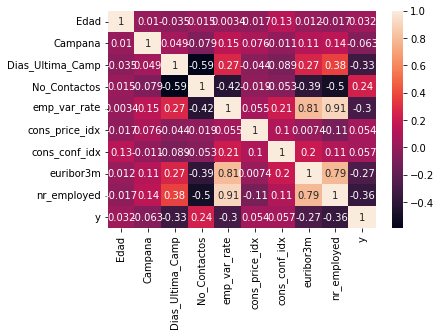

In [ ]:
numericasy = traindy.dtypes!=object
numericasy_ = traindy.columns[numericasy].tolist()
numericasy_
sns.heatmap(train[numericasy_].corr(),annot = True)

se evidencia la correlacion entre variables como emp_var_rate( tasa de variación del empleo ) y el nr_employed(el número de empleados)

### 3.2. Gráfico de interactivo

La siguiente funcion permite realizar un analisis descriptivo más personalizado

In [ ]:
#@title Install the facets_overview pip package.
!pip install facets-overview

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:83: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/facets_overview-1.0.0.dist-info/top_level.txt' mode='r' encoding='UTF-8'>



In [ ]:

# Display the Dive visualization for the training data.
from IPython.core.display import display, HTML

jsonstr = train.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

##4. Limpieza y transformación de los datos



Se mostro anteriormente que no habian datos nulos.

De acuerdo a el analisis previamente realizado se deben recategorizar algunas variables

In [ ]:
train = pd.read_csv('/content/REDES/REDES/train.csv')
test = pd.read_csv('/content/REDES/REDES/test.csv')

## Se indaga sobre las variables categóricas para hacer la transformación

Con Train

In [ ]:
trainc = train.drop('y', axis=1).copy()

In [ ]:
categoricas_ = traind.select_dtypes(include=['object']).columns
#train.info() #No hay valores nulo
categoricas_

Index(['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento',
       'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias', 'Resultado_Anterior'],
      dtype='object')

In [ ]:
# descripcion de la variables categoricas
train.select_dtypes(include=['object']).describe()

,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,Dias,Resultado_Anterior
count,26373,26373,26373,26373,26373,26373,26373,26373,26373,26373
unique,12,4,8,3,3,3,2,10,5,3
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent
freq,6657,15957,7623,20896,13921,21727,16659,8833,5484,22845


In [ ]:
#cuando se tiene mas de 5 categorias se recomienda hacer Ordinal Encoding si se tienen menos de 5
# se recomienda hacer One-Hot Encoding o dummy(dummy es mejor porque crea menos categorias)
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
ordinal_col1 = ['Tipo_Trabajo'] # variables ordinales
ordinal_col2 = ['Estado_Civil']
X1 = trainc[ordinal_col1]
X2 = trainc[ordinal_col2]

# OrdinalEncoder automatico
oe1 = OrdinalEncoder()
dd1=oe1.fit_transform(X1)

oe2 = OrdinalEncoder()
dd2=oe2.fit_transform(X2)
trainc['Tipo_Trabajo']=dd1
trainc['Estado_Civil']=dd2

In [ ]:
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
data = pd.DataFrame(train["Incumplimiento"])
#print(data)
encoder = OneHotEncoder(sparse=False)
# transform data
onehot = encoder.fit_transform(data)
onehot #no,unknown, yes
oh=pd.DataFrame(onehot)
oh.rename(columns = {0:'in_no', 1:'in_unk',2:'in_ye'}, inplace = True)
print(oh)

       in_no  in_unk  in_ye
0        1.0     0.0    0.0
1        1.0     0.0    0.0
2        0.0     1.0    0.0
3        1.0     0.0    0.0
4        1.0     0.0    0.0
...      ...     ...    ...
26368    1.0     0.0    0.0
26369    1.0     0.0    0.0
26370    0.0     1.0    0.0
26371    1.0     0.0    0.0
26372    1.0     0.0    0.0

[26373 rows x 3 columns]


In [ ]:
trainc['in_no']=oh['in_no']
trainc['in_unk']=oh['in_unk']
trainc['in_ye']=oh['in_ye']

In [ ]:
#o podriamos querer convertir a string un campo
#train['SEX']=["F" if i==1 else "M" for i in data1['SEX']]   #esta forma solo sirve para dos categorías de valor

In [ ]:
# encoder manual
trainc['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":6,"professional.course":7},  inplace = True)
trainc["Mes"].replace({"mar":3, "apr":4, "may":5,"jun":6,"jul":7,"aug":8,"sep":9,"oct":10,"nov":11,"dec":12},  inplace = True)
trainc["Dias"].replace({"mon":1, "tue":2, "wed":3,"thu":4,"fri":5},  inplace = True)

In [ ]:
dum_cols = ['Vivienda','Consumo','Contacto','Resultado_Anterior']#las columnas que se van a transformar con Dummies


In [ ]:
trainc = trainc.drop('Incumplimiento', axis=1).copy()
dftr_dummy = pd.get_dummies(trainc, prefix=dum_cols, columns=dum_cols, drop_first=True)
dftr_dummy

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,...,in_no,in_unk,in_ye,Vivienda_unknown,Vivienda_yes,Consumo_unknown,Consumo_yes,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
0,14110,44,0.0,1.0,6,7,1,4,999,0,...,1.0,0.0,0.0,0,1,0,1,0,1,0
1,13250,38,1.0,1.0,5,7,3,5,999,0,...,1.0,0.0,0.0,0,1,0,0,0,1,0
2,13728,52,1.0,2.0,0,7,5,11,999,0,...,0.0,1.0,0.0,0,0,0,1,0,1,0
3,27503,40,1.0,1.0,4,5,4,1,999,1,...,1.0,0.0,0.0,0,1,0,0,0,0,0
4,17265,31,0.0,2.0,6,8,2,2,999,0,...,1.0,0.0,0.0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,57,3.0,1.0,2,11,5,1,999,0,...,1.0,0.0,0.0,0,0,0,0,0,1,0
26369,27490,32,1.0,1.0,4,5,4,2,999,0,...,1.0,0.0,0.0,0,1,0,0,0,1,0
26370,353,57,9.0,1.0,2,5,2,1,999,0,...,0.0,1.0,0.0,0,0,0,1,1,1,0
26371,29033,32,9.0,1.0,7,6,1,1,999,0,...,1.0,0.0,0.0,0,1,0,0,0,1,0


In [ ]:
(dftr_dummy.set_index('ID',inplace=True))
dftr_dummy.index.name = None
dftr_dummy

,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,...,in_no,in_unk,in_ye,Vivienda_unknown,Vivienda_yes,Consumo_unknown,Consumo_yes,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
14110,44,0.0,1.0,6,7,1,4,999,0,1.4,...,1.0,0.0,0.0,0,1,0,1,0,1,0
13250,38,1.0,1.0,5,7,3,5,999,0,1.4,...,1.0,0.0,0.0,0,1,0,0,0,1,0
13728,52,1.0,2.0,0,7,5,11,999,0,1.4,...,0.0,1.0,0.0,0,0,0,1,0,1,0
27503,40,1.0,1.0,4,5,4,1,999,1,-1.8,...,1.0,0.0,0.0,0,1,0,0,0,0,0
17265,31,0.0,2.0,6,8,2,2,999,0,1.4,...,1.0,0.0,0.0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21736,57,3.0,1.0,2,11,5,1,999,0,-0.1,...,1.0,0.0,0.0,0,0,0,0,0,1,0
27490,32,1.0,1.0,4,5,4,2,999,0,-1.8,...,1.0,0.0,0.0,0,1,0,0,0,1,0
353,57,9.0,1.0,2,5,2,1,999,0,1.1,...,0.0,1.0,0.0,0,0,0,1,1,1,0
29033,32,9.0,1.0,7,6,1,1,999,0,-2.9,...,1.0,0.0,0.0,0,1,0,0,0,1,0


Con Test

In [ ]:
testc=test

In [ ]:
# descripcion de la variables categoricas
testc.select_dtypes(include=['object']).describe()

,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,Dias,Resultado_Anterior
count,6594,6594,6594,6594,6594,6594,6594,6594,6594,6594
unique,12,4,8,2,3,3,2,10,5,3
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent
freq,1660,3963,2014,5245,3471,5446,4234,2229,1417,5636


In [ ]:
ordinal_col1 = ['Tipo_Trabajo'] # variables ordinales
ordinal_col2 = ['Estado_Civil']
X1 = testc[ordinal_col1]
X2 = testc[ordinal_col2]

# OrdinalEncoder automatico
oe1 = OrdinalEncoder()
dd1=oe1.fit_transform(X1)

oe2 = OrdinalEncoder()
dd2=oe2.fit_transform(X2)
testc['Tipo_Trabajo']=dd1
testc['Estado_Civil']=dd2

In [ ]:
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
data = pd.DataFrame(test["Incumplimiento"])
#print(data)
encoder = OneHotEncoder(sparse=False)
# transform data
onehot = encoder.fit_transform(data)
onehot #no,unknown, yes
oh=pd.DataFrame(onehot)
oh.rename(columns = {0:'in_no', 1:'in_unk'}, inplace = True)
print(oh)

      in_no  in_unk
0       0.0     1.0
1       1.0     0.0
2       1.0     0.0
3       1.0     0.0
4       1.0     0.0
...     ...     ...
6589    0.0     1.0
6590    1.0     0.0
6591    1.0     0.0
6592    1.0     0.0
6593    0.0     1.0

[6594 rows x 2 columns]


In [ ]:
testc['in_no']=oh['in_no']
testc['in_unk']=oh['in_unk']
#testc['in_ye']=0

In [ ]:
# encoder manual
testc['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":6,"professional.course":7},  inplace = True)
testc["Mes"].replace({"mar":3, "apr":4, "may":5,"jun":6,"jul":7,"aug":8,"sep":9,"oct":10,"nov":11,"dec":12},  inplace = True)
testc["Dias"].replace({"mon":1, "tue":2, "wed":3,"thu":4,"fri":5},  inplace = True)

In [ ]:
testc = testc.drop('Incumplimiento', axis=1).copy()
dft_dummy = pd.get_dummies(testc, prefix=dum_cols, columns=dum_cols, drop_first=True)
dft_dummy

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,...,nr_employed,in_no,in_unk,Vivienda_unknown,Vivienda_yes,Consumo_unknown,Consumo_yes,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
0,30785,98,5.0,1.0,2,10,5,2,999,0,...,5017.5,0.0,1.0,0,1,0,0,0,1,0
1,14243,45,6.0,0.0,6,7,2,4,999,0,...,5228.1,1.0,0.0,0,0,0,0,0,1,0
2,20996,41,1.0,1.0,2,11,4,3,999,0,...,5195.8,1.0,0.0,0,1,0,0,1,1,0
3,31958,68,5.0,1.0,2,6,4,2,999,1,...,4991.6,1.0,0.0,0,1,0,0,0,0,0
4,10457,28,7.0,1.0,5,7,2,1,999,0,...,5228.1,1.0,0.0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,6069,43,9.0,1.0,7,5,5,5,999,0,...,5191.0,0.0,1.0,0,1,0,0,1,1,0
6590,21915,44,1.0,1.0,3,11,5,2,999,0,...,5195.8,1.0,0.0,0,1,0,1,0,1,0
6591,29479,52,9.0,1.0,7,6,1,1,999,0,...,5076.2,1.0,0.0,0,1,0,0,0,1,0
6592,1334,35,4.0,1.0,6,5,5,1,999,0,...,5191.0,1.0,0.0,0,1,0,1,1,1,0


In [ ]:
(dft_dummy.set_index('ID',inplace=True))
dft_dummy.index.name = None
dft_dummy

KeyError: ignored

# limpieza


### 4.1 Recategorización- esto no


#### 4.1.1. Recategorización en Train

In [ ]:
trainc = train.drop('y', axis=1).copy()
testc = test.copy()

In [ ]:
#train_test_clean = pd.concat([train_clean,test_clean], keys=['train','test'], axis = 0)
trainc['GrupoEdad'] = trainc['Edad'].apply(lambda x: 'joven' if (x < 20)
                                                                   else 'jovenAdulto' if (x >= 20 and x <= 30)
                                                                   else 'adulto' if (x >= 30 and x <= 50)
                                                                   else 'adulto+')
trainc['Grupocampana'] = trainc['Campana'].apply(lambda x: 'baja' if (x < 10)
                                                                   else 'media' if (x >= 10 and x <= 20)
                                                                   else 'alta')
trainc['Ulcampana'] = trainc['Dias_Ultima_Camp'].apply(lambda x: 'pocos' if (15 >= 10 and x <= 0)
                                                                   else 'medios' if (x >= 16 and x <= 40)
                                                                   else 'nunca')

# pendientes #No_Contactos, cons_price_idx,cons_conf_idx


In [ ]:
trainc=trainc.drop(['Edad','Campana','Dias_Ultima_Camp'],axis=1)

In [ ]:
trainc.columns

Index(['ID', 'Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento',
       'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias', 'No_Contactos',
       'Resultado_Anterior', 'emp_var_rate', 'cons_price_idx', 'cons_conf_idx',
       'euribor3m', 'nr_employed', 'GrupoEdad', 'Grupocampana', 'Ulcampana'],
      dtype='object')

In [ ]:
trainc.shape

(26373, 20)

In [ ]:
numericas = trainc.dtypes!=object
numericas_ = trainc.columns[numericas].tolist()
numericas_

['ID',
 'No_Contactos',
 'emp_var_rate',
 'cons_price_idx',
 'cons_conf_idx',
 'euribor3m',
 'nr_employed']

#### 4.1.2  Recategorización en Test

In [ ]:
testc['GrupoEdad'] = testc['Edad'].apply(lambda x: 'joven' if (x < 20)
                                                                   else 'jovenAdulto' if (x >= 20 and x <= 30)
                                                                   else 'adulto' if (x >= 30 and x <= 50)
                                                                   else 'adulto+')
testc['Grupocampana'] = testc['Campana'].apply(lambda x: 'baja' if (x < 10)
                                                                   else 'media' if (x >= 10 and x <= 20)
                                                                   else 'alta')
testc['Ulcampana'] = testc['Dias_Ultima_Camp'].apply(lambda x: 'pocos' if (15 >= 10 and x <= 0)
                                                                   else 'medios' if (x >= 16 and x <= 40)
                                                                   else 'nunca')

In [ ]:
testc=testc.drop(['Edad','Campana','Dias_Ultima_Camp'],axis=1)


In [ ]:
test.columns

Index(['ID', 'Edad', 'Tipo_Trabajo', 'Estado_Civil', 'Educacion',
       'Incumplimiento', 'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias',
       'Campana', 'Dias_Ultima_Camp', 'No_Contactos', 'Resultado_Anterior',
       'emp_var_rate', 'cons_price_idx', 'cons_conf_idx', 'euribor3m',
       'nr_employed'],
      dtype='object')

In [ ]:
categoricas_tr = trainc.select_dtypes(include=['object']).columns
categoricas_tr

Index(['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento',
       'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias', 'Resultado_Anterior',
       'GrupoEdad', 'Grupocampana', 'Ulcampana'],
      dtype='object')

In [ ]:
trainc.No_Contactos.unique()

array([0, 1, 2, 3, 4, 5, 6])

### 4.2 Tranformacion a Dummy

In [ ]:
dftr_dummy = pd.get_dummies(trainc, prefix=categoricas_tr, columns=categoricas_tr, drop_first=True)
dftr_dummy

,ID,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,Tipo_Trabajo_blue-collar,Tipo_Trabajo_entrepreneur,Tipo_Trabajo_housemaid,...,Dias_wed,Resultado_Anterior_nonexistent,Resultado_Anterior_success,GrupoEdad_adulto+,GrupoEdad_joven,GrupoEdad_jovenAdulto,Grupocampana_baja,Grupocampana_media,Ulcampana_nunca,Ulcampana_pocos
0,14110,0,1.4,93918.0,-42.7,4962.0,5228.1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
1,13250,0,1.4,93918.0,-42.7,4963.0,5228.1,1,0,0,...,1,1,0,0,0,0,1,0,1,0
2,13728,0,1.4,93918.0,-42.7,4962.0,5228.1,1,0,0,...,0,1,0,1,0,0,0,1,1,0
3,27503,1,-1.8,92893.0,-46.2,1266.0,5099.1,1,0,0,...,0,0,0,0,0,0,1,0,1,0
4,17265,0,1.4,93444.0,-36.1,4963.0,5228.1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,0,-0.1,93.2,-42.0,4021.0,5195.8,0,0,1,...,0,1,0,1,0,0,1,0,1,0
26369,27490,0,-1.8,92893.0,-46.2,1266.0,5099.1,1,0,0,...,0,1,0,0,0,0,1,0,1,0
26370,353,0,1.1,93994.0,-36.4,4857.0,5191.0,0,0,0,...,0,1,0,1,0,0,1,0,1,0
26371,29033,0,-2.9,92963.0,-40.8,1266.0,5076.2,0,0,0,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
(dftr_dummy.set_index('ID',inplace=True))
dftr_dummy.index.name = None
dftr_dummy

,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,Tipo_Trabajo_blue-collar,Tipo_Trabajo_entrepreneur,Tipo_Trabajo_housemaid,Tipo_Trabajo_management,...,Dias_wed,Resultado_Anterior_nonexistent,Resultado_Anterior_success,GrupoEdad_adulto+,GrupoEdad_joven,GrupoEdad_jovenAdulto,Grupocampana_baja,Grupocampana_media,Ulcampana_nunca,Ulcampana_pocos
14110,0,1.4,93918.0,-42.7,4962.0,5228.1,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
13250,0,1.4,93918.0,-42.7,4963.0,5228.1,1,0,0,0,...,1,1,0,0,0,0,1,0,1,0
13728,0,1.4,93918.0,-42.7,4962.0,5228.1,1,0,0,0,...,0,1,0,1,0,0,0,1,1,0
27503,1,-1.8,92893.0,-46.2,1266.0,5099.1,1,0,0,0,...,0,0,0,0,0,0,1,0,1,0
17265,0,1.4,93444.0,-36.1,4963.0,5228.1,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21736,0,-0.1,93.2,-42.0,4021.0,5195.8,0,0,1,0,...,0,1,0,1,0,0,1,0,1,0
27490,0,-1.8,92893.0,-46.2,1266.0,5099.1,1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
353,0,1.1,93994.0,-36.4,4857.0,5191.0,0,0,0,0,...,0,1,0,1,0,0,1,0,1,0
29033,0,-2.9,92963.0,-40.8,1266.0,5076.2,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
categoricas_t = testc.select_dtypes(include=['object']).columns
categoricas_t

Index(['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento',
       'Vivienda', 'Consumo', 'Contacto', 'Mes', 'Dias', 'Resultado_Anterior',
       'GrupoEdad', 'Grupocampana', 'Ulcampana'],
      dtype='object')

In [ ]:
dft_dummy = pd.get_dummies(testc, prefix=categoricas_t, columns=categoricas_t, drop_first=True)
dft_dummy

,ID,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,Tipo_Trabajo_blue-collar,Tipo_Trabajo_entrepreneur,Tipo_Trabajo_housemaid,...,Dias_wed,Resultado_Anterior_nonexistent,Resultado_Anterior_success,GrupoEdad_adulto+,GrupoEdad_joven,GrupoEdad_jovenAdulto,Grupocampana_baja,Grupocampana_media,Ulcampana_nunca,Ulcampana_pocos
0,30785,0,-3.4,92431.0,-26.9,0.730,5017.5,0,0,0,...,0,1,0,1,0,0,1,0,1,0
1,14243,0,1.4,93918.0,-42.7,4961.000,5228.1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
2,20996,0,-0.1,93.2,-42.0,4076.000,5195.8,1,0,0,...,0,1,0,0,0,0,1,0,1,0
3,31958,1,-1.7,94055.0,-39.8,0.742,4991.6,0,0,0,...,0,0,0,1,0,0,1,0,1,0
4,10457,0,1.4,93918.0,-42.7,4962.000,5228.1,0,0,0,...,0,1,0,0,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,6069,0,1.1,93994.0,-36.4,4864.000,5191.0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
6590,21915,0,-0.1,93.2,-42.0,4021.000,5195.8,1,0,0,...,0,1,0,0,0,0,1,0,1,0
6591,29479,0,-2.9,92963.0,-40.8,1.260,5076.2,0,0,0,...,0,1,0,1,0,0,1,0,1,0
6592,1334,0,1.1,93994.0,-36.4,4855.000,5191.0,0,0,0,...,0,1,0,0,0,0,1,0,1,0


In [ ]:
dft_dummy.set_index('ID',inplace=True)
dft_dummy.index.name = None
dft_dummy

,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,Tipo_Trabajo_blue-collar,Tipo_Trabajo_entrepreneur,Tipo_Trabajo_housemaid,Tipo_Trabajo_management,...,Dias_wed,Resultado_Anterior_nonexistent,Resultado_Anterior_success,GrupoEdad_adulto+,GrupoEdad_joven,GrupoEdad_jovenAdulto,Grupocampana_baja,Grupocampana_media,Ulcampana_nunca,Ulcampana_pocos
30785,0,-3.4,92431.0,-26.9,0.730,5017.5,0,0,0,0,...,0,1,0,1,0,0,1,0,1,0
14243,0,1.4,93918.0,-42.7,4961.000,5228.1,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
20996,0,-0.1,93.2,-42.0,4076.000,5195.8,1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
31958,1,-1.7,94055.0,-39.8,0.742,4991.6,0,0,0,0,...,0,0,0,1,0,0,1,0,1,0
10457,0,1.4,93918.0,-42.7,4962.000,5228.1,0,0,0,0,...,0,1,0,0,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6069,0,1.1,93994.0,-36.4,4864.000,5191.0,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
21915,0,-0.1,93.2,-42.0,4021.000,5195.8,1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
29479,0,-2.9,92963.0,-40.8,1.260,5076.2,0,0,0,0,...,0,1,0,1,0,0,1,0,1,0
1334,0,1.1,93994.0,-36.4,4855.000,5191.0,0,0,0,1,...,0,1,0,0,0,0,1,0,1,0


Las variables se transforman en Dummy

### 4.3 Normalizar

In [ ]:
dftr_dummy
dft_dummy
df_train = (dftr_dummy-dftr_dummy.min())/(dftr_dummy.max()-dftr_dummy.min())
df_test= (dft_dummy-dft_dummy.min()) / (dft_dummy.max()-dft_dummy.min())
df_test
#print(df_train,df_test)


,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,...,nr_employed,in_no,in_unk,Vivienda_unknown,Vivienda_yes,Consumo_unknown,Consumo_yes,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
30785,1.000000,0.454545,0.333333,0.285714,0.777778,1.00,0.026316,1.0,0.000000,0.000000,...,0.203781,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
14243,0.345679,0.545455,0.000000,0.857143,0.444444,0.25,0.078947,1.0,0.000000,1.000000,...,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
20996,0.296296,0.090909,0.333333,0.285714,0.888889,0.75,0.052632,1.0,0.000000,0.687500,...,0.877883,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
31958,0.629630,0.454545,0.333333,0.285714,0.333333,0.75,0.026316,1.0,0.166667,0.354167,...,0.105860,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
10457,0.135802,0.636364,0.333333,0.714286,0.444444,0.25,0.000000,1.0,0.000000,1.000000,...,1.000000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6069,0.320988,0.818182,0.333333,1.000000,0.222222,1.00,0.105263,1.0,0.000000,0.937500,...,0.859735,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
21915,0.333333,0.090909,0.333333,0.428571,0.888889,1.00,0.026316,1.0,0.000000,0.687500,...,0.877883,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
29479,0.432099,0.818182,0.333333,1.000000,0.333333,0.00,0.000000,1.0,0.000000,0.104167,...,0.425709,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1334,0.222222,0.363636,0.333333,0.857143,0.222222,1.00,0.000000,1.0,0.000000,0.937500,...,0.859735,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0


In [ ]:
df_test['in_ye']=0

## 5. Métodos


In [ ]:
X=df_train
y=train.y
X_train, X_test, y_train, y_test = sk.model_selection.train_test_split(X, y, test_size=0.20, random_state=42)
kf = KFold(n_splits=5) # validación cruzada

### 5.1 Regresión Logística(RL)



In [ ]:
kf = KFold(n_splits=5) # validación cruzada
RL = LogisticRegression()
RL.fit(X_train, y_train)
score = RL.score(X_train,y_train)
print("Metrica del modelo", score)

Metrica del modelo 0.900180111858944


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
scores = cross_val_score(RL, X_train, y_train, cv=kf, scoring="roc_auc")
#print(cross_val_score(dtree, X, y, scoring="roc_auc", cv = 7))
print("ROC_AUC", scores)
print("ROC_AUC", scores.mean())


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


ROC_AUC [0.78567562 0.77989382 0.81239469 0.79143462 0.80017266]
ROC_AUC 0.7939142847844881


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
predictions = RL.predict(X_test)
print(accuracy_score(y_test, predictions))

0.8976303317535546


In [ ]:
print(confusion_matrix(y_test, predictions))

[[4617   61]
 [ 479  118]]


In [ ]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y, modelo_regresion_logistica.predict_proba(X)[:, 1])

0.7911509292839374

In [ ]:
#predictions = RL.predict(X)
#print(confusion_matrix(train.y, predictions))

### 5.2. RANDOM FOREST(RF)

In [ ]:
param_grid = ParameterGrid(
                {'n_estimators': [100,150],
                 'max_features': [5, 7, 9],
                 'max_depth'   : [None, 3,9, 10, 20],
                 'criterion'   : ['gini', 'entropy']
                }
            )

# Ajustar un modelo con cada combinación de hiperparámetros

resultados = {'params': [], 'oob_accuracy': []}

for params in param_grid:

    modelo = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                ** params
             )

    modelo.fit(X_train, y_train)

    resultados['params'].append(params)
    resultados['oob_accuracy'].append(modelo.oob_score_)
    print(f"Modelo: {params} \u2713")

# Resultados

resultados = pd.DataFrame(resultados)
resultados = pd.concat([resultados, resultados['params'].apply(pd.Series)], axis=1)
resultados = resultados.sort_values('oob_accuracy', ascending=False)
resultados = resultados.drop(columns = 'params')
resultados.head(4)

Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 5, 'n_estimators': 100} ✓
Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 5, 'n_estimators': 150} ✓
Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 7, 'n_estimators': 100} ✓
Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 7, 'n_estimators': 150} ✓
Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 9, 'n_estimators': 100} ✓
Modelo: {'criterion': 'gini', 'max_depth': None, 'max_features': 9, 'n_estimators': 150} ✓
Modelo: {'criterion': 'gini', 'max_depth': 3, 'max_features': 5, 'n_estimators': 100} ✓
Modelo: {'criterion': 'gini', 'max_depth': 3, 'max_features': 5, 'n_estimators': 150} ✓
Modelo: {'criterion': 'gini', 'max_depth': 3, 'max_features': 7, 'n_estimators': 100} ✓
Modelo: {'criterion': 'gini', 'max_depth': 3, 'max_features': 7, 'n_estimators': 150} ✓
Modelo: {'criterion': 'gini', 'max_depth': 3, 'max_features': 9, 'n_estimators': 100} ✓
Modelo: {'crit

,oob_accuracy,criterion,max_depth,max_features,n_estimators
40,0.900938,entropy,3.0,9,100
9,0.900844,gini,3.0,7,150
38,0.900796,entropy,3.0,7,100
39,0.900796,entropy,3.0,7,150


In [ ]:
# Mejores hiperparámetros por out-of-bag error

print(resultados.iloc[0,0], ":", resultados.iloc[0,:]['oob_accuracy'], "accuracy")

0.9011280690112807 : 0.9011280690112807 accuracy


In [ ]:
rf = RandomForestClassifier(max_depth=10, n_estimators=150, random_state=123, criterion='entropy')
rf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=150,
                       random_state=123)

In [ ]:
scores = cross_val_score(rf, X_train, y_train, cv=kf, scoring="roc_auc")


In [ ]:
scores.mean()

0.8001498778670845

In [ ]:
predicciones = rf.predict(X = X_test)
#predicciones[:10]

In [ ]:
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

print(mat_confusion)


In [ ]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y, rf.predict_proba(X)[:, 1])

In [ ]:
#rf_predicciones = rf.predict(X = df_train)
#print(confusion_matrix(train.y, rf_predicciones))

In [ ]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y, rf.predict_proba(X)[:, 1])

In [ ]:
predicciones = rf.predict_proba(X = X_test)
predicciones[:5, :]

In [ ]:
#rf_predicciones = pd.DataFrame(data=predicciones, columns=['0', '1'])
#rf_predicciones['clasificacion_default_0.5'] = np.where(rf_predicciones['0'] > rf_predicciones['1'], 0, 1)
#rf_predicciones.head(3)

In [ ]:
importancia_predictores = pd.DataFrame(
                            {'predictor': X_train.columns,
                             'importancia': rf.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

## red neuronal- MLPClassifier

In [ ]:
param_distributions = {
    'hidden_layer_sizes': [(3),(4),(10),(20),(3,4),(10, 10),(20,20),(10,10,10)],
    'max_iter': [500,1000],
    'learning_rate_init': [0.0001,0.001, 0.01, 0.1],
}

In [ ]:
grid = RandomizedSearchCV(
        estimator  = sk.neural_network.MLPClassifier(activation='relu'),
        param_distributions = param_distributions,
        n_iter     = 50,
        scoring    = 'neg_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = 5,
        verbose    = 0,
        random_state = 42,
        return_train_score = True
       )


In [ ]:
grid.fit(X = X_train, y = y_train)# 9 min

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


In [ ]:
MLP = grid.best_estimator_
y_pred = MLP.predict(X_test)
#print(sk.metrics.mean_squared_error(y_test, y_pred))
#print(sk.metrics.r2_score(y_test, y_pred))

AttributeError: ignored

In [ ]:
#y_pred = modelo_final.predict(X = df_train)
#predicciones[:10]
#y_pred

array([0.05505159, 0.04425999, 0.0202489 , ..., 0.03845071, 0.3040006 ,
       0.03164676])

In [ ]:
Y_predict = MLP.predict(df_train)
pred=[]

for i in range(len(Y_predict)):
    if Y_predict[i] >= 0.35:
        pred.append(1)
    else:
        pred.append(0)

In [ ]:
print(confusion_matrix(train.y, pred))

[[22402   993]
 [ 1805  1173]]


##CNN-keras

In [ ]:
#Red neuronal
model = Sequential()
model.add(Dense(128,input_dim = X_train.shape[1],activation="relu"))#Al tener 177 var entrada, comenz con capa de 256 neuronas. input_dim = dimens d imput

model.add(Dense(64,activation="relu"))                             # Aqui funcionara la función de activación _relu_
model.add(Dense(32,activation="relu"))
model.add(Dense(1,activation = "sigmoid"))                          # 1 nerurona de salida, usamos _sigmoid_
model.compile(optimizer = "Adam",loss="binary_crossentropy",metrics=["AUC"])

print(model.summary())

ValueError: ignored

In [ ]:
hist=model.fit(X_train,y_train, validation_data = (X_test,y_test),epochs=8, batch_size=16)#verbose=False

Epoch 1/8
1319/1319 [==============================] - 6s 4ms/step - loss: 0.2915 - auc: 0.7703 - val_loss: 0.3003 - val_auc: 0.7554
Epoch 2/8
1319/1319 [==============================] - 6s 4ms/step - loss: 0.2831 - auc: 0.7814 - val_loss: 0.2915 - val_auc: 0.7624
Epoch 3/8
1319/1319 [==============================] - 4s 3ms/step - loss: 0.2819 - auc: 0.7821 - val_loss: 0.2908 - val_auc: 0.7637
Epoch 4/8
1319/1319 [==============================] - 3s 2ms/step - loss: 0.2804 - auc: 0.7845 - val_loss: 0.2905 - val_auc: 0.7614
Epoch 5/8
1319/1319 [==============================] - 3s 2ms/step - loss: 0.2794 - auc: 0.7873 - val_loss: 0.2920 - val_auc: 0.7655
Epoch 6/8
1319/1319 [==============================] - 3s 2ms/step - loss: 0.2785 - auc: 0.7891 - val_loss: 0.2899 - val_auc: 0.7662
Epoch 7/8
1319/1319 [==============================] - 3s 2ms/step - loss: 0.2784 - auc: 0.7873 - val_loss: 0.2897 - val_auc: 0.7666
Epoch 8/8
1319/1319 [==============================] - 3s 2ms/step - 

In [ ]:
result = model.evaluate(X_test,y_test)
for i in range(len(model.metrics_names)):
 print("Metric ",model.metrics_names[i],":",str(round(result[i],2)))

165/165 [==============================] - 0s 1ms/step - loss: 0.4127 - auc: 0.7276
Metric  loss : 0.41
Metric  auc : 0.73


In [ ]:
Y_predict = model.predict(df_train)
pred=[]

for i in range(len(Y_predict)):
    if Y_predict[i] >= 0.35:
        pred.append(1)
    else:
        pred.append(0)

conf_matrix = confusion_matrix(train.y, pred)
conf_matrix

array([[22490,   905],
       [ 1224,  1754]])

In [ ]:
auc_keras

0.7106599693637061

Comparación

In [ ]:
from sklearn.metrics import roc_curve
y_pred_keras = model.predict(X_test).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_keras)


#y_pred_red = modelo_final.predict(X_test).ravel()
#fpr_red, tpr_red, thresholds_red = roc_curve(y_test, y_pred_red)


#AUC valor

from sklearn.metrics import auc
auc_keras = auc(fpr_keras, tpr_keras)

#auc_red=auc(fpr_red, tpr_red)


from sklearn.ensemble import RandomForestClassifier
# Supervised transformation based on random forests
rf = RandomForestClassifier(max_depth=10, n_estimators=150, random_state=123, criterion='entropy')
rf.fit(X_train, y_train)

y_pred_rf = rf.predict_proba(X_test)[:, 1]
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_pred_rf)
auc_rf = auc(fpr_rf, tpr_rf)
auc_rf


rl = linear_model.LogisticRegression()
rl.fit(X_train, y_train)


y_pred_rl = rl.predict_proba(X_test)[:, 1]
fpr_rl, tpr_rl, thresholds_rl = roc_curve(y_test, y_pred_rl)
auc_rl = auc(fpr_rl, tpr_rl)
auc_rl




/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.7572426404503636

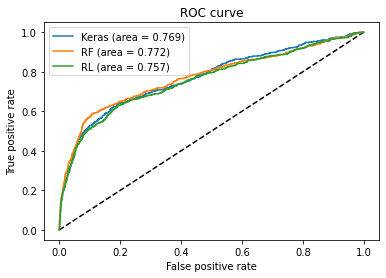

In [ ]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
#plt.plot(fpr_red, tpr_red, label='MLPClassifier (area = {:.3f})'.format(auc_red))
plt.plot(fpr_rf, tpr_rf, label='RF (area = {:.3f})'.format(auc_rf))
plt.plot(fpr_rl, tpr_rl, label='RL (area = {:.3f})'.format(auc_rl))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
# Zoom in view of the upper left corner.

In [ ]:
df_test["Incumplimiento_yes"]=0

In [ ]:
Y_predict = rf.predict(df_test)
Y_predict.shape

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.




(6594,)

In [ ]:
test["ID"]

0       30785
1       14243
2       20996
3       31958
4       10457
        ...  
6589     6069
6590    21915
6591    29479
6592     1334
6593     1862
Name: ID, Length: 6594, dtype: int64

In [ ]:
pred=[]
for i in range(len(Y_predict)):
    if Y_predict[i] >= 0.35:
        pred.append(1)
    else:
        pred.append(0)

pred
sub = pd.Series(pred,index=test['ID'],name='y')
sub.head()

ID
30785    0
14243    0
20996    0
31958    1
10457    0
Name: y, dtype: int64

In [ ]:
sub = pd.Series(Y_predict,index=test['ID'],name='y')
sub.head()
sub.to_csv('archivo_a_enviar32.csv')

## AUTOENCODERS

In [ ]:
resp=train[["ID","y"]]
resp.set_index('ID',inplace=True)
resp.index.name = None
#resp
#X




In [ ]:
df3 = pd.concat([X, resp], axis=1)
#df3=df3.iloc[:, [0,1,2,3,4,5,6,7,8,9,10,56] ]

In [ ]:

X_train, X_test = train_test_split(df3, test_size=0.2, random_state=42)
X_train = X_train[X_train.y == 0]  ## Usaremos únicamente la clase 0 (transacciones normales)
X_train = X_train.drop(['y'], axis=1)
X_train = X_train.values

Y_test = X_test['y']
X_test = X_test.drop(['y'], axis=1)
X_test = X_test.values
print(X_train.shape,X_test.shape)

(18717, 56) (5275, 56)


In [ ]:

np.random.seed(5)


dim_entrada = X_train.shape[1]
capa_entrada = Input(shape=(dim_entrada,))

In [ ]:


encoder = Dense(20, activation='tanh')(capa_entrada)
encoder = Dense(14, activation='relu')(encoder)

In [ ]:
decoder = Dense(20, activation='tanh')(encoder)
decoder = Dense(56, activation='relu')(decoder)# numero de salidas

In [ ]:


autoencoder = Model(inputs=capa_entrada, outputs=decoder)

In [ ]:
#from keras.optimizers import SGD


sgd = SGD(lr=0.01)
autoencoder.compile(optimizer='sgd', loss='mse')

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



In [ ]:
nits = 100
tam_lote = 32
autoencoder.fit(X_train,X_train, epochs=nits, batch_size=tam_lote, shuffle=True, validation_data=(X_test,X_test), verbose=1)


Epoch 1/100
585/585 [==============================] - 2s 2ms/step - loss: 0.1561 - val_loss: 0.1202
Epoch 2/100
585/585 [==============================] - 1s 2ms/step - loss: 0.1089 - val_loss: 0.1036
Epoch 3/100
585/585 [==============================] - 1s 2ms/step - loss: 0.1007 - val_loss: 0.1005
Epoch 4/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0988 - val_loss: 0.0994
Epoch 5/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0976 - val_loss: 0.0975
Epoch 6/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0956 - val_loss: 0.0963
Epoch 7/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0947 - val_loss: 0.0955
Epoch 8/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0940 - val_loss: 0.0947
Epoch 9/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0933 - val_loss: 0.0940
Epoch 10/100
585/585 [==============================] - 1s 2ms/step - loss: 0.0926 - val_lo

In [ ]:
X_pred = autoencoder.predict(X_test)

In [ ]:
ecm = np.mean(np.power(X_test-X_pred,2), axis=1)

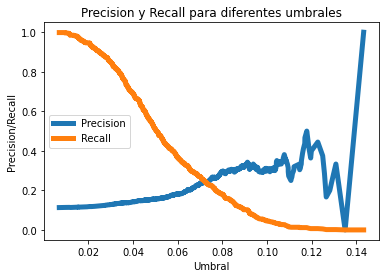

In [ ]:

precision, recall, umbral = precision_recall_curve(Y_test, ecm)

plt.plot(umbral, precision[1:], label="Precision",linewidth=5)
plt.plot(umbral, recall[1:], label="Recall",linewidth=5)
plt.title('Precision y Recall para diferentes umbrales')
plt.xlabel('Umbral')
plt.ylabel('Precision/Recall')
plt.legend()
plt.show()

In [ ]:
y_pred_auto = autoencoder.predict(X_test).ravel()
y_pred_auto
#fpr_auto, tpr_auto, thresholds_auto = roc_curve(y_test, y_pred_auto)


#AUC valor

#from sklearn.metrics import auc
#auc_auto = auc(fpr_auto, tpr_auto)

array([0.        , 1.0158554 , 0.7740886 , ..., 0.        , 1.0047127 ,
       0.17024015], dtype=float32)

In [ ]:
umbral_fijo = 0.08
Y_pred = [1 if e > umbral_fijo else 0 for e in ecm]

In [ ]:


conf_matrix = confusion_matrix(Y_test, Y_pred)
print(conf_matrix)

[[4420  258]
 [ 489  108]]


In [ ]:
base=pd.read_csv("/content/REDES/REDES/train.csv",encoding="latin-1",sep=',')
base=base.set_index("ID")
base.columns.str.replace(' ','')
base.head()
# se hacen pruebas para eliminar variables




,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Vivienda,Consumo,Contacto,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
ID,,,,,,,,,,,,,,,,,,,,
14110,44,admin.,married,university.degree,no,yes,yes,cellular,jul,mon,4,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
13250,38,blue-collar,married,high.school,no,yes,no,cellular,jul,wed,5,999,0,nonexistent,1.4,93918.0,-42.7,4963.0,5228.1,0
13728,52,blue-collar,single,unknown,unknown,no,yes,cellular,jul,fri,11,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
27503,40,blue-collar,married,basic.9y,no,yes,no,cellular,may,thu,1,999,1,failure,-1.8,92893.0,-46.2,1266.0,5099.1,0
17265,31,admin.,single,university.degree,no,no,yes,cellular,aug,tue,2,999,0,nonexistent,1.4,93444.0,-36.1,4963.0,5228.1,0


In [ ]:
# Se amplica prueba de hiposteis, como Anova y Chisquared,para comprobar la relación de la vraiables
# independientes con la baria y (acquiere CDT), para comenzar a eliminar posibles variables que no
# aporten nada al modelo.

# Implementación de Anova

import statsmodels as sm
import statsmodels.formula.api as smf
f_statis=[]
f_st=[]
for i in base.columns:
    if i =="y":
        break
    else: anova = smf.ols(formula='y ~ '+i, data=base).fit()
    if anova.f_pvalue<=0.1:
        f_statis.append(i)
    f_st.append([i,anova.f_pvalue])

In [ ]:
from scipy.stats import *
chi_test=[]
chi_st=[]
for i in base.columns:
    if i=="y" or i=="ID":
        break
    else:
        pivot= pd.pivot_table(base[["y",i]],index=i, columns="y", aggfunc=len).fillna(0)
        chi2, p, dof, ex = chi2_contingency(pivot, correction=False)
    if p<=0.1:
        chi_test.append(i)
    chi_st.append([i,p])

# Bajo ANOVA y Chisquared se determinó las mismas variables que encuentran relación con la variable repuesta
comparacion=[]
for i,j in zip(f_statis,chi_test):
    if i in chi_test and j in f_statis:
        comparacion.append([i,j])

# Determino que variables no mostraron correlación con la respuesta usando cualquiera de las dos listas

for i in [i for i in base.columns]:
    if i not in f_statis:
        print(i)
# Vivienda y consumo, que hacen referecia a si tienen un crédito de consumo o vivienda,
# no muestran relación frente a si adquiere o no un CDT, bajo las dos pruebas implementadas
# anteriormente.



Vivienda
Consumo
y


In [ ]:
base=base.drop(columns=(["Vivienda","Consumo"]))
base=base.reset_index()

In [ ]:
base

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Incumplimiento,Contacto,Mes,Dias,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
0,14110,44,admin.,married,university.degree,no,cellular,jul,mon,4,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
1,13250,38,blue-collar,married,high.school,no,cellular,jul,wed,5,999,0,nonexistent,1.4,93918.0,-42.7,4963.0,5228.1,0
2,13728,52,blue-collar,single,unknown,unknown,cellular,jul,fri,11,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0
3,27503,40,blue-collar,married,basic.9y,no,cellular,may,thu,1,999,1,failure,-1.8,92893.0,-46.2,1266.0,5099.1,0
4,17265,31,admin.,single,university.degree,no,cellular,aug,tue,2,999,0,nonexistent,1.4,93444.0,-36.1,4963.0,5228.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,57,housemaid,married,basic.4y,no,cellular,nov,fri,1,999,0,nonexistent,-0.1,93.2,-42.0,4021.0,5195.8,0
26369,27490,32,blue-collar,married,basic.9y,no,cellular,may,thu,2,999,0,nonexistent,-1.8,92893.0,-46.2,1266.0,5099.1,0
26370,353,57,technician,married,basic.4y,unknown,telephone,may,tue,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
26371,29033,32,technician,married,professional.course,no,cellular,jun,mon,1,999,0,nonexistent,-2.9,92963.0,-40.8,1266.0,5076.2,0


In [ ]:
categoricas=base[['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento', 'Contacto', 'Resultado_Anterior']]

def one_hot(datos,nombre):

    x_one=[]
    data=[i for i in datos]
    unicos=np.unique(data)
    nombres=[nombre+"_"+str(i) for i in unicos]
    for i in unicos:
        d=[]
        for j in data:
            if i==j:
                d.append(1)
            else: d.append(0)
        x_one.append(d)
    x_one=pd.DataFrame(np.array(x_one).T, columns=(nombres))
    return x_one


def agregado(data,base):
    base=base
    for i in [i for i in data.columns]:
        base[i]=data[i]
    return base

for i in categoricas.columns:
    base=agregado((one_hot(categoricas[i],i)),base)

base=base.drop(columns=([i for i in categoricas]))
base=base.set_index("ID")
# A pesar que mes y día resultaron significativas en las pruebas ANOVA y Chi Squared,
# intuitivamente no tienne un sentido real dentro del modelo, por eso las elimino de la base.
base=base.drop(columns=(["Mes","Dias"]))

In [ ]:
base

,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,...,Educacion_university.degree,Educacion_unknown,Incumplimiento_no,Incumplimiento_unknown,Incumplimiento_yes,Contacto_cellular,Contacto_telephone,Resultado_Anterior_failure,Resultado_Anterior_nonexistent,Resultado_Anterior_success
ID,,,,,,,,,,,,,,,,,,,,,
14110,44,4,999,0,1.4,93918.0,-42.7,4962.0,5228.1,0,...,1,0,1,0,0,1,0,0,1,0
13250,38,5,999,0,1.4,93918.0,-42.7,4963.0,5228.1,0,...,0,0,1,0,0,1,0,0,1,0
13728,52,11,999,0,1.4,93918.0,-42.7,4962.0,5228.1,0,...,0,1,0,1,0,1,0,0,1,0
27503,40,1,999,1,-1.8,92893.0,-46.2,1266.0,5099.1,0,...,0,0,1,0,0,1,0,1,0,0
17265,31,2,999,0,1.4,93444.0,-36.1,4963.0,5228.1,0,...,1,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21736,57,1,999,0,-0.1,93.2,-42.0,4021.0,5195.8,0,...,0,0,1,0,0,1,0,0,1,0
27490,32,2,999,0,-1.8,92893.0,-46.2,1266.0,5099.1,0,...,0,0,1,0,0,1,0,0,1,0
353,57,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0,0,...,0,0,0,1,0,0,1,0,1,0


In [ ]:
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
data = pd.DataFrame(train["Incumplimiento"])
#print(data)
encoder = OneHotEncoder(sparse=False)
# transform data
onehot = encoder.fit_transform(data)
onehot #no,unknown, yes
oh=pd.DataFrame(onehot)
oh.rename(columns = {0:'in_no', 1:'in_unk',2:'in_ye'}, inplace = True)
print(oh)

       in_no  in_unk  in_ye
0        1.0     0.0    0.0
1        1.0     0.0    0.0
2        0.0     1.0    0.0
3        1.0     0.0    0.0
4        1.0     0.0    0.0
...      ...     ...    ...
26368    1.0     0.0    0.0
26369    1.0     0.0    0.0
26370    0.0     1.0    0.0
26371    1.0     0.0    0.0
26372    1.0     0.0    0.0

[26373 rows x 3 columns]


In [ ]:
base['Educacion'].replace({"unknown":0, "illiterate":1, "basic.4y":2,"basic.6y":3,"basic.9y":4,"high.school":5,"university.degree":6,"professional.course":7},  inplace = True)


In [ ]:
#base=base.drop(columns=(["Mes","Dias"]))
base=base.drop(columns=(["Incumplimiento"]))

In [ ]:
base['in_no']=oh['in_no']
base['in_unk']=oh['in_unk']
base['in_ye']=oh['in_ye']

In [ ]:
base

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Contacto,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,in_no,in_unk,in_ye
0,14110,44,admin.,married,6,cellular,4,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0,1.0,0.0,0.0
1,13250,38,blue-collar,married,5,cellular,5,999,0,nonexistent,1.4,93918.0,-42.7,4963.0,5228.1,0,1.0,0.0,0.0
2,13728,52,blue-collar,single,0,cellular,11,999,0,nonexistent,1.4,93918.0,-42.7,4962.0,5228.1,0,0.0,1.0,0.0
3,27503,40,blue-collar,married,4,cellular,1,999,1,failure,-1.8,92893.0,-46.2,1266.0,5099.1,0,1.0,0.0,0.0
4,17265,31,admin.,single,6,cellular,2,999,0,nonexistent,1.4,93444.0,-36.1,4963.0,5228.1,0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,57,housemaid,married,2,cellular,1,999,0,nonexistent,-0.1,93.2,-42.0,4021.0,5195.8,0,1.0,0.0,0.0
26369,27490,32,blue-collar,married,4,cellular,2,999,0,nonexistent,-1.8,92893.0,-46.2,1266.0,5099.1,0,1.0,0.0,0.0
26370,353,57,technician,married,2,telephone,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0,0.0,1.0,0.0
26371,29033,32,technician,married,7,cellular,1,999,0,nonexistent,-2.9,92963.0,-40.8,1266.0,5076.2,0,1.0,0.0,0.0


In [ ]:
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
data = pd.DataFrame(train["Incumplimiento"])
#print(data)
encoder = OneHotEncoder(sparse=False)
# transform data
onehot = encoder.fit_transform(data)
onehot #no,unknown, yes
oh=pd.DataFrame(onehot)
oh.rename(columns = {0:'in_no', 1:'in_unk',2:'in_ye'}, inplace = True)
print(oh)

       in_no  in_unk  in_ye
0        1.0     0.0    0.0
1        1.0     0.0    0.0
2        0.0     1.0    0.0
3        1.0     0.0    0.0
4        1.0     0.0    0.0
...      ...     ...    ...
26368    1.0     0.0    0.0
26369    1.0     0.0    0.0
26370    0.0     1.0    0.0
26371    1.0     0.0    0.0
26372    1.0     0.0    0.0

[26373 rows x 3 columns]


In [ ]:
dum_cols = ['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Contacto', 'Resultado_Anterior']

train_d = pd.get_dummies(base, prefix=dum_cols, columns=dum_cols, drop_first=True)


In [ ]:
train_d

,ID,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,...,Educacion_1,Educacion_2,Educacion_3,Educacion_4,Educacion_5,Educacion_6,Educacion_7,Contacto_telephone,Resultado_Anterior_nonexistent,Resultado_Anterior_success
0,14110,44,4,999,0,1.4,93918.0,-42.7,4962.0,5228.1,...,0,0,0,0,0,1,0,0,1,0
1,13250,38,5,999,0,1.4,93918.0,-42.7,4963.0,5228.1,...,0,0,0,0,1,0,0,0,1,0
2,13728,52,11,999,0,1.4,93918.0,-42.7,4962.0,5228.1,...,0,0,0,0,0,0,0,0,1,0
3,27503,40,1,999,1,-1.8,92893.0,-46.2,1266.0,5099.1,...,0,0,0,1,0,0,0,0,0,0
4,17265,31,2,999,0,1.4,93444.0,-36.1,4963.0,5228.1,...,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26368,21736,57,1,999,0,-0.1,93.2,-42.0,4021.0,5195.8,...,0,1,0,0,0,0,0,0,1,0
26369,27490,32,2,999,0,-1.8,92893.0,-46.2,1266.0,5099.1,...,0,0,0,1,0,0,0,0,1,0
26370,353,57,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0,...,0,1,0,0,0,0,0,1,1,0
26371,29033,32,1,999,0,-2.9,92963.0,-40.8,1266.0,5076.2,...,0,0,0,0,0,0,1,0,1,0


In [ ]:
x_test=pd.read_csv("/content/REDES/REDES/test.csv",encoding="latin-1",sep=',')
x_test=x_test.drop(columns=(["Mes","Dias","Vivienda","Consumo"]))
cate_test=x_test[['Tipo_Trabajo', 'Estado_Civil', 'Educacion', 'Incumplimiento', 'Contacto', 'Resultado_Anterior']]
ID=x_test["ID"]


for i in cate_test.columns:
    x_test=agregado((one_hot(cate_test[i],i)),x_test)

x_test=x_test.drop(columns=([i for i in cate_test]))

# bases de entrenamiento

x_train=base.drop(columns=['y'])
y_train=base["y"]

# comprobrar que todas la variables de la muestra de etrenamiento se encuentren en la muestra test
for i in x_train.columns:
    if i not in [i for i in x_test.columns]:
        print(i)
for i in x_test.columns:
    if i not in [i for i in x_train.columns]:
        print(i)

# no existe la respuesta si en la varible incumplimiento, por lo tanto creo una columna no
# la columna faltante

x_test["Incumplimiento_yes"]=np.zeros(x_test.shape[0],dtype=int)
x_test=x_test.set_index("ID")

Incumplimiento_yes
ID


In [ ]:
x=base.drop(columns=['y'])
y=base['y']
X_train, X_test, Y_train, Y_test = train_test_split(
  x, y, test_size=0.25)

In [ ]:
X_test

,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,Tipo_Trabajo_admin.,...,Educacion_university.degree,Educacion_unknown,Incumplimiento_no,Incumplimiento_unknown,Incumplimiento_yes,Contacto_cellular,Contacto_telephone,Resultado_Anterior_failure,Resultado_Anterior_nonexistent,Resultado_Anterior_success
ID,,,,,,,,,,,,,,,,,,,,,
31758,52,5,999,1,-1.8,93876.0,-40.0,0.684,5008.7,0,...,1,0,1,0,0,1,0,1,0,0
27825,29,3,999,0,-1.8,92893.0,-46.2,1266.000,5099.1,0,...,0,0,1,0,0,1,0,0,1,0
1603,35,5,999,0,1.1,93994.0,-36.4,4857.000,5191.0,0,...,0,0,1,0,0,0,1,0,1,0
28323,33,3,999,0,-1.8,92893.0,-46.2,1.250,5099.1,0,...,0,0,1,0,0,1,0,0,1,0
4252,52,1,999,0,1.1,93994.0,-36.4,4857.000,5191.0,0,...,0,0,1,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,48,2,999,0,1.4,94465.0,-41.8,4967.000,5228.1,0,...,0,0,1,0,0,0,1,0,1,0
22217,38,2,999,2,-1.8,92843.0,-50.0,1687.000,5099.1,0,...,1,0,1,0,0,1,0,1,0,0
14927,39,10,999,0,1.4,93918.0,-42.7,4968.000,5228.1,1,...,0,1,1,0,0,1,0,0,1,0


In [ ]:
from sklearn.ensemble import RandomForestClassifier


base_2=pd.read_csv("/content/REDES/REDES/train.csv",encoding="latin-1",sep=',')
base_2=base_2.set_index("ID")
base_2=base_2.drop(columns=(["Mes","Dias","Vivienda","Consumo"]))

x_2=base_2.drop(columns=['y'])
y_2=base_2['y']
xtrain, xtest, ytrain, ytest = train_test_split(
  x_2, y_2, test_size=0.25)

0.748955987701825


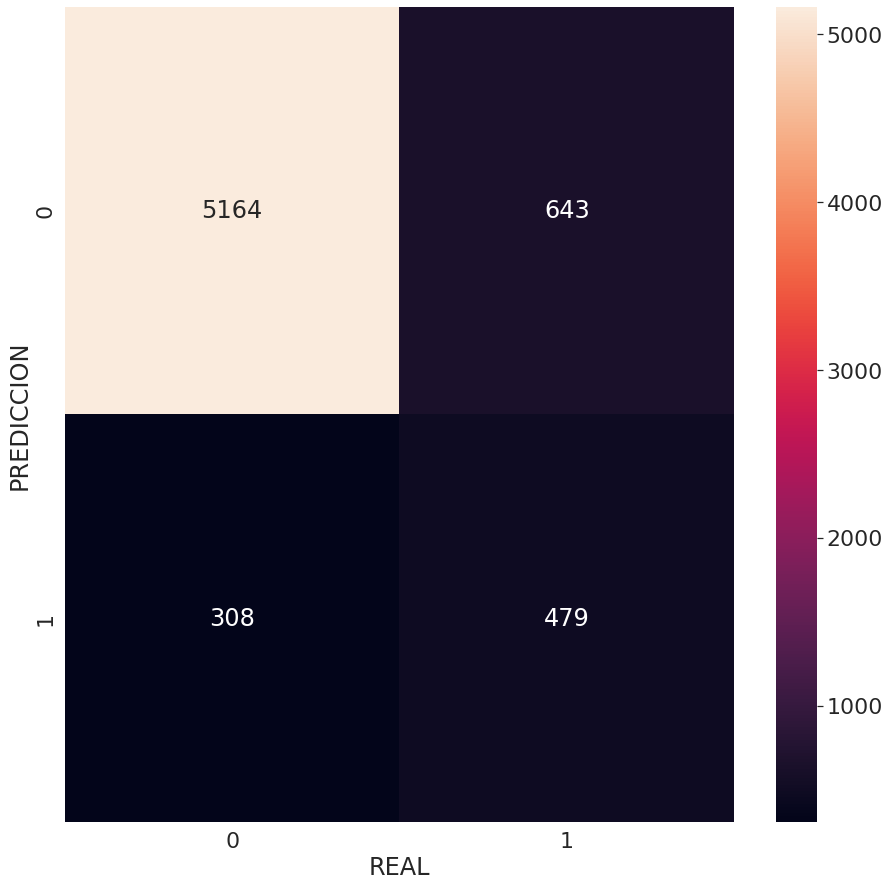

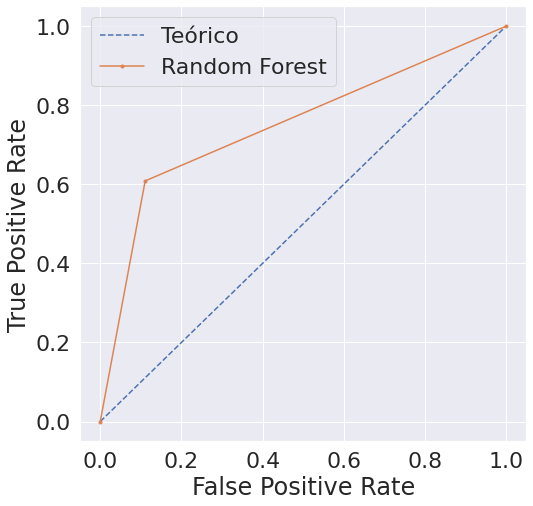

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import *
from sklearn.ensemble import RandomForestClassifier
modelo_rf= RandomForestClassifier(max_depth=11,class_weight=
                                  "balanced", random_state=0).fit(X_train, Y_train)
y_predrf=modelo_rf.predict(X_test)
print(roc_auc_score(Y_test, y_predrf))

# Matriz de Confusión, para ver la distribución de falsos positivos y falsos negativos
arr_3=confusion_matrix(Y_test, y_predrf,labels=[0,1])

sample = pd.DataFrame(arr_3, index = [0,1],
                  columns = [0,1])
sns.set(font_scale=2)
plt.figure(figsize = (15,15))
sns.heatmap(sample,annot=True,fmt='g').set( ylabel='PREDICCION', xlabel='REAL')

ns_probs = [0 for _ in range(len(Y_test))]
ns_fpr, ns_tpr, _ = roc_curve(Y_test, ns_probs)
model_fp_2, model_tpr_2, _ = roc_curve(Y_test, y_predrf)

plt.figure(figsize = (8,8))
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='Teórico')
plt.plot(model_fp_2, model_tpr_2, marker='.', label='Random Forest')


plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()


In [ ]:
model_fp_2


array([0.        , 0.11072843, 1.        ])